In [78]:
suppressPackageStartupMessages({
    library(data.table)
    library(Matrix)
    library(dplyr)
    library(SingleCellExperiment)
    library(batchelor)
    library(scuttle)
    library(ggpubr)
    library(scater)
    library(scran)
    library(BiocParallel)
    library(Seurat)
})

In [79]:
io = list()
io$main = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/extended/endothelium'
io$sce = file.path(io$main, '/endo_sce.rds')
io$plotdir = file.path(io$main, 'plots')
io$haem_landscape = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna/mapping_ivan'
dir.create(io$plotdir, recursive=T)

Warning message in dir.create(io$plotdir, recursive = T):
“'/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/extended/endothelium/plots' already exists”


In [80]:
sce = readRDS(io$sce)

In [81]:
summary(rownames(sce)==NULL)

   Mode 
logical 

In [82]:
haem_full_landscape = readRDS(file.path(io$haem_landscape, "haem_full_landscape.rds"))

In [83]:
colnames(haem_full_landscape) = haem_full_landscape$cell

In [84]:
meta_haem = as.data.table(colData(haem_full_landscape))

In [85]:
colnames(meta_haem)

[1] "cell"                        "Dim1"                       
 [3] "Dim2"                        "sample"                     
 [5] "stage"                       "stage.mapped"               
 [7] "stage.collapsed"             "stage.mapped.collapsed"     
 [9] "somite_count"                "tube_name"                  
[11] "tube_name_corrected"         "celltype"                   
[13] "celltype.extended"           "celltype.descendant"        
[15] "celltype.descendant.somites" "doub.density"               
[17] "cluster"                     "cluster.sub"                
[19] "celltype.clustering"

In [86]:
unique(meta_haem$celltype.extended)

[1] Epiblast                       Primitive Streak              
 [3] Nascent mesoderm               Blood progenitors 2           
 [5] Mixed mesoderm                 ExE mesoderm                  
 [7] Intermediate mesoderm          Pharyngeal mesoderm           
 [9] Caudal epiblast                Haematoendothelial progenitors
[11] Blood progenitors 1            Paraxial mesoderm             
[13] Mesenchyme                     Somitic mesoderm              
[15] Caudal Mesoderm                Erythroid1                    
[17] Allantois                      Anterior Primitive Streak     
[19] Endothelium                    Cardiomyocytes                
[21] Erythroid2                     Erythroid3                    
[23] Undetermined                  
38 Levels: Allantois Anterior Primitive Streak ... Undetermined

In [87]:
meta = as.data.table(colData(sce))

In [88]:
unique(meta$embryo_version)

[1] Original  Extension
Levels: Extension Original

In [89]:
haem_redu = meta_haem[,c('cell', 'Dim1', 'Dim2')] %>% 
    merge(meta[,'cell'], by='cell', all.y=T) %>% 
    .[,`:=`(Dim1=ifelse(is.na(Dim1), 0, Dim1), Dim2=ifelse(is.na(Dim2), 0, Dim2))] %>%
    .[match(colnames(sce), cell)] %>%
    as.data.frame() %>% tibble::column_to_rownames('cell') %>% as.matrix()

In [90]:
reducedDim(sce,"haem_redu") = haem_redu

In [91]:
meta$UMI = colSums(counts(sce)>0)
meta$genes = colSums(counts(sce)>0)

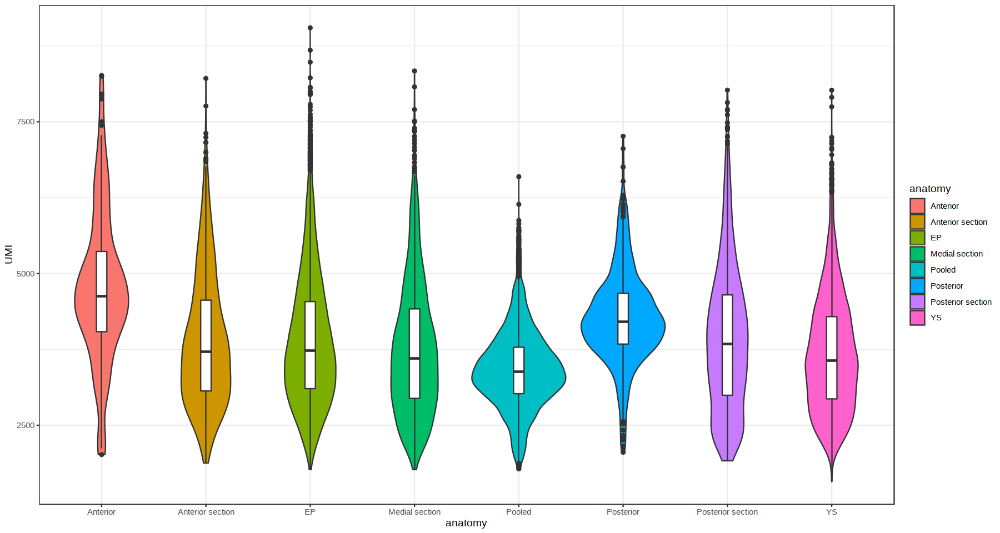

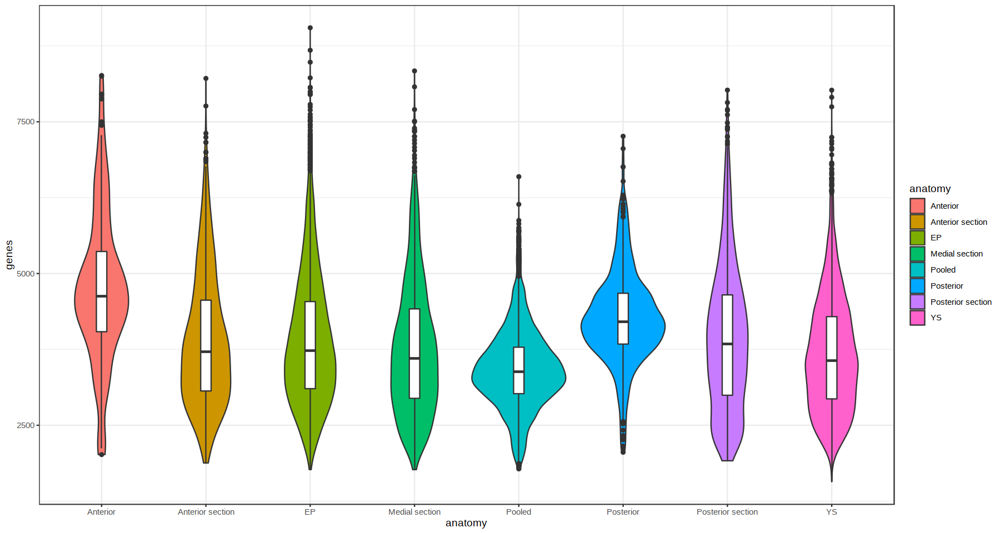

In [92]:
ggplot(meta, aes(anatomy, UMI)) + geom_violin(aes(fill=anatomy)) + geom_boxplot(width=0.1) + theme_bw()
ggplot(meta, aes(anatomy, genes)) + geom_violin(aes(fill=anatomy)) + geom_boxplot(width=0.1) + theme_bw()

### Dimensionality reduction

In [93]:
# remove genes with missing gene names
sce = sce[!is.na(rownames(sce))]
sce = sce[rownames(sce)!='']

In [94]:
non_informative =  rownames(sce)[grep("*Rik|^Gm|^Mt-|^Rps|^Rpl|^Olfr", rownames(sce))]
sce_filt = sce[!rownames(sce) %in% non_informative,]

In [95]:
# Determine HVGs
decomp = modelGeneVar(sce_filt)
decomp = decomp[decomp$mean > 0.01,]
hvgs = decomp[order(decomp$FDR),] %>% head(n=5000) %>% rownames

# Subset SingleCellExperiment
sce_filt = sce_filt[hvgs,]

In [96]:
# Dimensionality reduction
sce_filt <- runPCA(sce_filt, ncomponents = 20, ntop=5000)

In [97]:
percent.var <- data.table(PC = factor(paste0('PC', 1:20), levels = paste0('PC', 1:20)), Var_expl = attr(reducedDim(sce_filt, 'PCA'), "percentVar"))

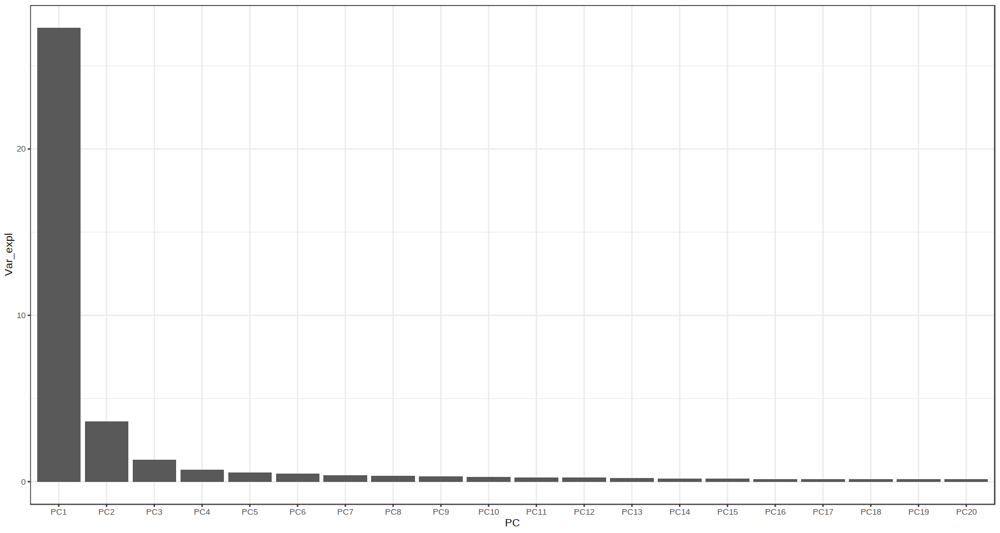

In [98]:
ggplot(percent.var, aes(PC, Var_expl)) + geom_bar(stat='identity') + theme_bw()
# 30% of Varance explained in one PC, lets explore this.

In [99]:
PC.dt <- reducedDim(sce_filt,"PCA") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
    merge(meta, by='cell')

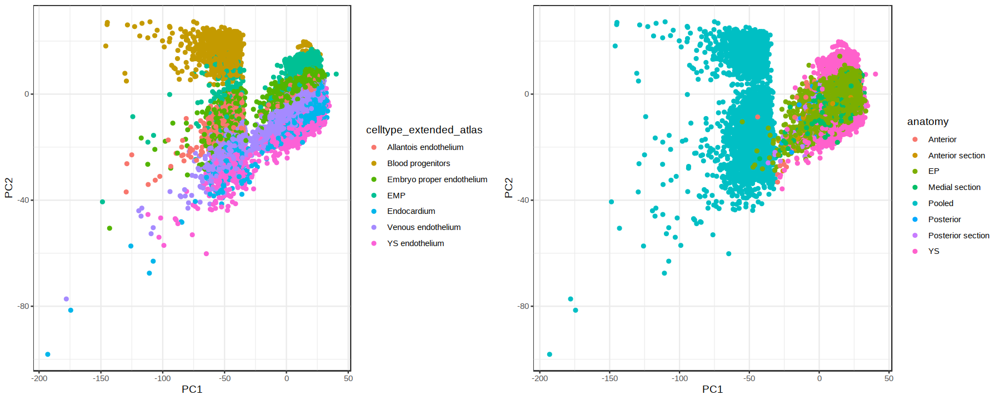

In [100]:
options(repr.plot.width=15,repr.plot.height=6)
ggarrange(
    ggplot(PC.dt, aes(PC1, PC2, col=celltype_extended_atlas)) + 
        geom_point() + 
        theme_bw() + theme(panel.background=element_rect(color='black', fill=NA)),
    ggplot(PC.dt, aes(PC1, PC2, col=anatomy)) + 
        geom_point() + 
        theme_bw() + theme(panel.background=element_rect(color='black', fill=NA))
)
# PC1 = anatomy pooled vs rest = batch effect from original vs extended
# PC2 = cell type

In [101]:
# Top genes for PC1
rotation = as.data.table(attr(reducedDim(sce_filt, 'PCA'), "rotation"), keep.rownames=T) %>% setnames('rn', 'gene') %>% 
    .[order(-abs(PC1))]
head(rotation$gene, 20)

[1] "Pgk1"    "Timm8a1" "Slc25a5" "Tuba1b"  "Car2"    "Cnbp"    "Cycs"   
 [8] "Eif4a1"  "Ldha"    "Hnrnpu"  "Hdgf"    "Lsm7"    "Nhp2l1"  "Aldoa"  
[15] "Ranbp1"  "Pfn1"    "Srm"     "Snrpg"   "Eif3g"   "Hbb-bh1"

In [102]:
# Try with batch correction between extension and original atlas
decomp <- modelGeneVar(sce, block=colData(sce)$embryo_version)
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% head(n=5000) %>% rownames

# Subset SingleCellExperiment
sce_filt <- sce[hvgs,]

# PCA
pca.list <- multiBatchPCA(sce_filt, batch = colData(sce_filt)$embryo_version, d = 20, preserve.single=FALSE)
# batch correction 
pca.corrected <- reducedMNN(pca.list, merge.order=1:length(pca.list))$corrected 

colnames(pca.corrected) <- paste0("PC",1:ncol(pca.corrected))

reducedDim(sce_filt, "PCA") <- pca.corrected[colnames(sce_filt),]

PC.dt <- reducedDim(sce_filt,"PCA") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
    merge(meta, by='cell')

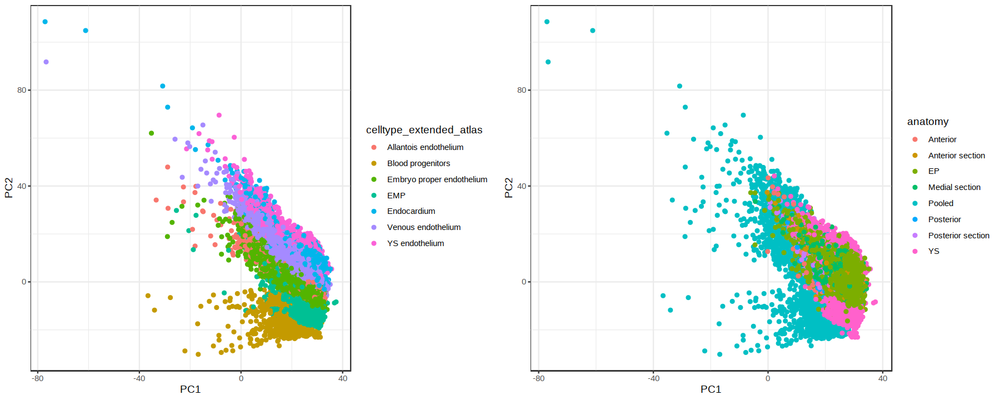

In [103]:
options(repr.plot.width=15,repr.plot.height=6)
ggarrange(
    ggplot(PC.dt, aes(PC1, PC2, col=celltype_extended_atlas)) + 
        geom_point() + 
        theme_bw() + theme(panel.background=element_rect(color='black', fill=NA)),
    ggplot(PC.dt, aes(PC1, PC2, col=anatomy)) + 
        geom_point() + 
        theme_bw() + theme(panel.background=element_rect(color='black', fill=NA))
)
# batch correction seems to work overall

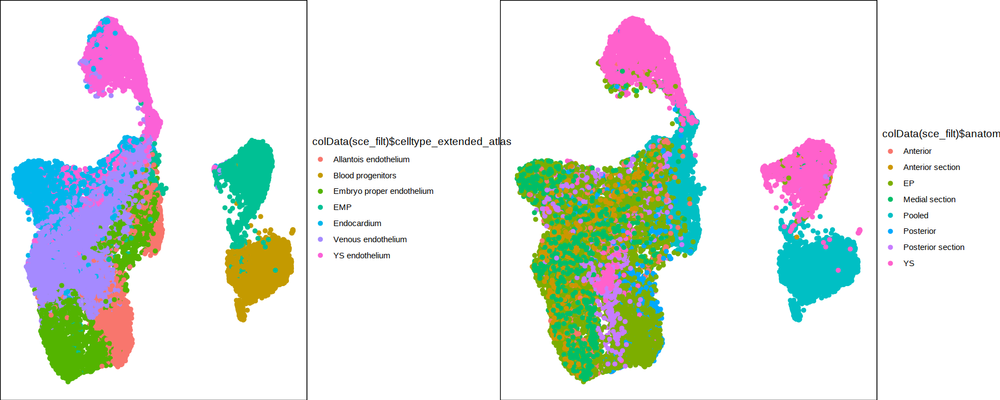

In [104]:
# UMAP
sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 30, min_dist = 0.3)

# Fetch UMAP coordinates
umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_filt)] %>%
  setnames(c("UMAP1","UMAP2","cell"))

options(repr.plot.width=15,repr.plot.height=6)
ggarrange(
    ggplot(umap.dt, aes(UMAP1, UMAP2, col=colData(sce_filt)$celltype_extended_atlas)) + 
        geom_point() + 
        theme_void() + 
        theme(panel.border=element_rect(color='black', fill=NA)),
    ggplot(umap.dt, aes(UMAP1, UMAP2, col=colData(sce_filt)$anatomy)) + 
        geom_point() + 
        theme_void() + 
        theme(panel.border=element_rect(color='black', fill=NA))
)

In [105]:
####
#### Instead of batch correction I remove the original sample, not ideal
####
# # I'm removing the pooled sample before it messes up the rest of the analysis. 
# sce = sce[,as.character(meta[anatomy!='Pooled', cell])]
# meta = meta[match(colnames(sce), cell)]

# # Remove non informative genes
# non_informative =  rownames(sce)[grep("*Rik|^Gm|^Mt-|^Rps|^Rpl|^Olfr", rownames(sce))]
# sce_filt = sce[!rownames(sce) %in% non_informative,]

# # Determine HVGs
# decomp = modelGeneVar(sce_filt)
# decomp = decomp[decomp$mean > 0.01,]
# hvgs = decomp[order(decomp$FDR),] %>% head(n=5000) %>% rownames

# # Subset SingleCellExperiment
# sce_filt = sce_filt[hvgs,]

# # Dimensionality reduction
# sce_filt <- runPCA(sce_filt, ncomponents = 20, ntop=5000)

# percent.var <- data.table(PC = factor(paste0('PC', 1:20), levels = paste0('PC', 1:20)), Var_expl = attr(reducedDim(sce_filt, 'PCA'), "percentVar"))

# ggplot(percent.var, aes(PC, Var_expl)) + geom_bar(stat='identity') + theme_bw()

# PC.dt <- reducedDim(sce_filt,"PCA") %>% as.data.table %>% 
#   .[,cell:=colnames(sce_filt)] %>%
#     merge(meta, by='cell')

# options(repr.plot.width=15,repr.plot.height=6)
# ggarrange(
#     ggplot(PC.dt, aes(PC1, PC2, col=celltype_extended_atlas)) + 
#         geom_point() + 
#         theme_bw() + theme(panel.background=element_rect(color='black', fill=NA)),
#     ggplot(PC.dt, aes(PC1, PC2, col=anatomy)) + 
#         geom_point() + 
#         theme_bw() + theme(panel.background=element_rect(color='black', fill=NA))
# )
# # PC1 = anatomy pooled vs rest = batch effect
# # PC2 = cell type

# # UMAP
# sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 30, min_dist = 0.3)

# # Fetch UMAP coordinates
# umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
#   .[,cell:=colnames(sce_filt)] %>%
#   setnames(c("UMAP1","UMAP2","cell"))

# options(repr.plot.width=15,repr.plot.height=6)
# ggarrange(
#     ggplot(umap.dt, aes(UMAP1, UMAP2, col=colData(sce_filt)$celltype_extended_atlas)) + 
#         geom_point() + 
#         theme_void() + 
#         theme(panel.border=element_rect(color='black', fill=NA)),
#     ggplot(umap.dt, aes(UMAP1, UMAP2, col=colData(sce_filt)$anatomy)) + 
#         geom_point() + 
#         theme_void() + 
#         theme(panel.border=element_rect(color='black', fill=NA))
# )

In [106]:
plot_gene = function(gene, sce_in, reducedDim = 'UMAP', save_plot=TRUE){
    # Fetch UMAP coordinates
    umap.dt <- reducedDim(sce_in,reducedDim) %>% as.data.table %>% 
      .[,cell:=colnames(sce_in)] %>%
      setnames(c("UMAP1","UMAP2","cell"))
    
    p1 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=as.vector(logcounts(sce_in[gene,])))) + 
        geom_point() + 
        viridis::scale_color_viridis(name = gene) + 
        ggtitle(gene) + 
        theme_void() +
        theme(panel.border=element_rect(color='black', fill=NA),
             text=element_text(size=15))
    p2 = ggplot(meta[match(colnames(sce_in), cell)], aes(celltype_extended_atlas, as.vector(logcounts(sce_in[gene,])), fill=celltype_extended_atlas)) + 
        geom_point(size= 0.05, alpha=0.05, 
                   position = position_jitter(width = 0.3)) + 
        geom_violin() +
        geom_boxplot(width=0.1, fill='white', outlier.shape=NA) + 
        ggtitle(gene) + ylab('Expression') +  xlab('') + 
        theme_bw() + 
        theme(panel.border=element_rect(color='black', fill=NA),
             text=element_text(size=15),
             axis.text.x=element_text(angle=-90, hjust=0, vjust=1),
             legend.position='none')
    
    p = ggarrange(p1, p2, widths = c(0.6, 0.4))

    if(save_plot){
        pdf(sprintf('%s/%s_%s_%s.pdf', io$plotdir, gene, deparse(substitute(sce_in)), reducedDim), width=15, height = 7)
            print(p)
        dev.off()
    }else{    
        return(p)
    }
}

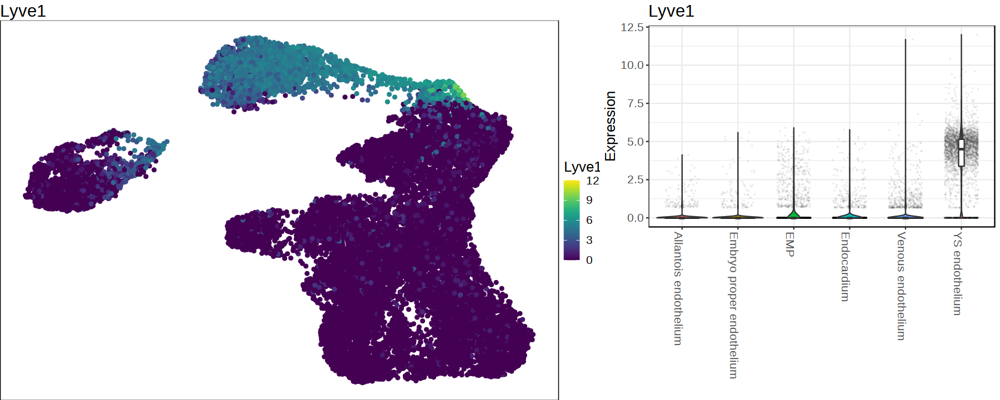

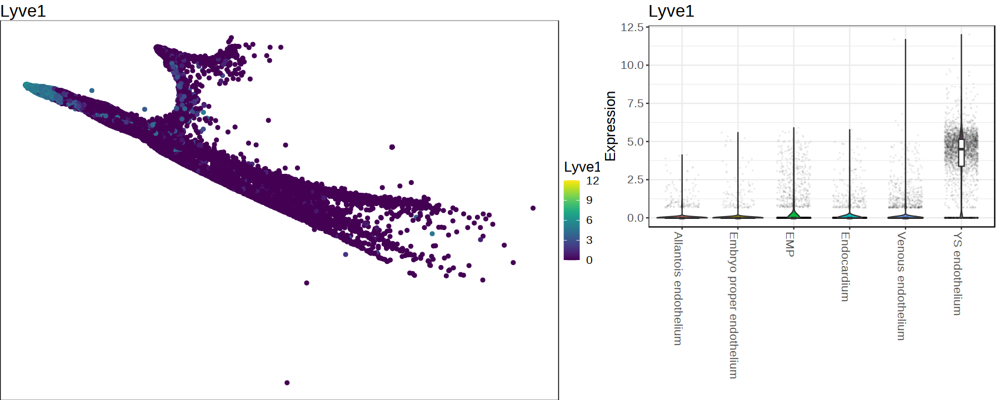

In [109]:
plot_gene('Lyve1', sce_filt, reducedDim = 'UMAP', save_plot=FALSE)
plot_gene('Lyve1', sce_filt, reducedDim = 'haem_redu', save_plot=FALSE)

In [35]:
plot_genes = c('Apoa2', 'Lyve1', 'Afp', 'Stab2', 'Ttr', 'Apoa1', 'Apob', 'Hapln1', 'Mif', 'Eno1', 'Pkm', 'Mdk', 'Tuba1a', 'Lgals1', 'Mrc1', 'Selenop', 'Cdk8')

In [36]:
lapply(plot_genes, plot_gene, sce_in = sce_filt, reducedDim = 'haem_redu')

[[1]]
png 
  2 

[[2]]
png 
  2 

[[3]]
png 
  2 

[[4]]
png 
  2 

[[5]]
png 
  2 

[[6]]
png 
  2 

[[7]]
png 
  2 

[[8]]
png 
  2 

[[9]]
png 
  2 

[[10]]
png 
  2 

[[11]]
png 
  2 

[[12]]
png 
  2 

[[13]]
png 
  2 

[[14]]
png 
  2 

[[15]]
png 
  2 

[[16]]
png 
  2 

[[17]]
png 
  2

In [107]:
seurat_filt = as.Seurat(sce_filt)

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from Dim to Dim_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to Dim_”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from PC to PC_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to PC_”


In [108]:
ident = seurat_filt@meta.data$celltype_extended_atlas
names(ident) = colnames(sce_filt)

In [109]:
seurat_filt@active.ident = ident

In [ ]:
markers = FindAllMarkers(seurat_filt)

Calculating cluster Allantois endothelium

Calculating cluster Blood progenitors

Calculating cluster Embryo proper endothelium

Calculating cluster EMP

Calculating cluster Endocardium

Calculating cluster Venous endothelium

Calculating cluster YS endothelium



In [69]:
top_markers = as.data.table(markers) %>% .[,head(.SD,10), by='cluster']
top_markers

In [ ]:
p = lapply(top_markers$gene, plot_gene, sce_in = sce_filt, reducedDim = 'UMAP', save_plot=FALSE)
p

In [19]:
#to run the same analysis on a specific subpopulation
subset_sce = function(sce_in, npcs = 10){
    # Determine HVGs
    # Try with batch correction between extension and original atlas
    decomp <- modelGeneVar(sce_YS, block=colData(sce_YS)$embryo_version)
    decomp <- decomp[decomp$mean > 0.01,]
    hvgs <- decomp[order(decomp$FDR),] %>% head(n=5000) %>% rownames

    # Subset SingleCellExperiment
    sce_filt <- sce_YS[hvgs,]

    # PCA
    pca.list <- multiBatchPCA(sce_filt, batch = colData(sce_filt)$embryo_version, d = 20, preserve.single=FALSE)
    # batch correction 
    pca.corrected <- reducedMNN(pca.list, merge.order=1:length(pca.list))$corrected 

    colnames(pca.corrected) <- paste0("PC",1:ncol(pca.corrected))

    reducedDim(sce_filt, "PCA") <- pca.corrected[colnames(sce_in),]

    PC.dt <- reducedDim(sce_filt,"PCA") %>% as.data.table %>% 
      .[,cell:=colnames(sce_filt)] %>%
        merge(meta, by='cell')

    options(repr.plot.width=15,repr.plot.height=6)
    p2 = ggarrange(
        ggplot(PC.dt, aes(PC1, PC2, col=celltype_extended_atlas)) + 
            geom_point() + 
            theme_bw() + theme(panel.background=element_rect(color='black', fill=NA)),
        ggplot(PC.dt, aes(PC1, PC2, col=anatomy)) + 
            geom_point() + 
            theme_bw() + theme(panel.background=element_rect(color='black', fill=NA))
    )
    # PC1 = anatomy pooled vs rest = batch effect
    # PC2 = cell type

    # UMAP
    sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 30, min_dist = 0.3)

    # Fetch UMAP coordinates
    umap.dt <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
      .[,cell:=colnames(sce_filt)] %>%
      setnames(c("UMAP1","UMAP2","cell"))

    options(repr.plot.width=15,repr.plot.height=6)
    p3 = ggarrange(
        ggplot(umap.dt, aes(UMAP1, UMAP2, col=colData(sce_filt)$celltype_extended_atlas)) + 
            geom_point() + 
            theme_void() + 
            theme(panel.border=element_rect(color='black', fill=NA)),
        ggplot(umap.dt, aes(UMAP1, UMAP2, col=colData(sce_filt)$anatomy)) + 
            geom_point() + 
            theme_void() + 
            theme(panel.border=element_rect(color='black', fill=NA))
    )
    print(p2)
    print(p3)
    
    reducedDim(sce_in,"UMAP") = reducedDim(sce_filt,"UMAP")
    return(sce_in)
}

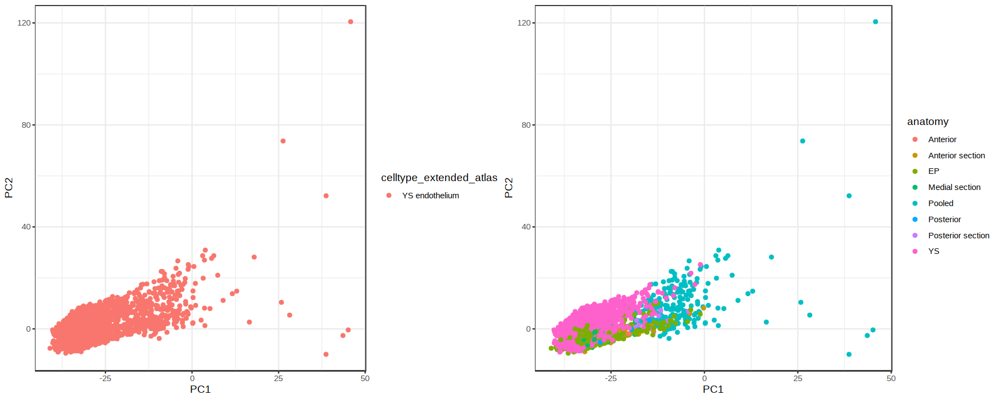

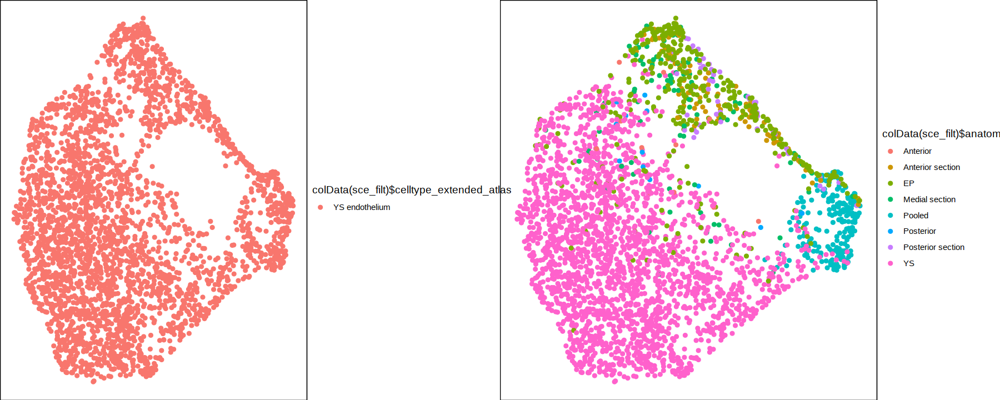

In [20]:
# pass selection criteria in the meta[selection filter]
sce_YS = sce[,as.character(meta[celltype_extended_atlas%in%c('YS endothelium'), cell])]
sce_YS = subset_sce(sce_YS, npcs=15)

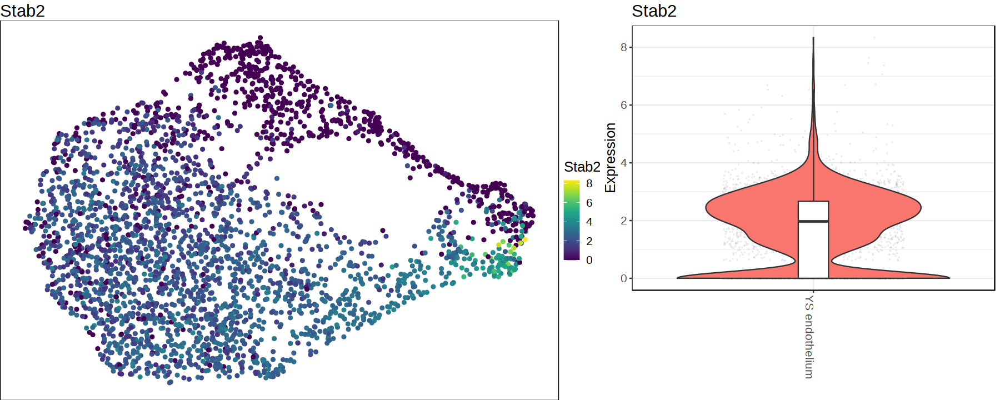

In [21]:
plot_gene('Stab2', sce_YS, reducedDim = 'UMAP', save_plot=FALSE)

In [22]:
plot_genes = c('Lyve1', 'Ptprc', 'Neurl3', 'Csf1r', 'Plek', 'Spn', 'Erg', 'Itga2b', 'Fli1', 'Hoxa7', 'Etv2', 'Sox7', 'Ttr', 'Afp', 'Spink1', 'Cd34', 'Mef2c')

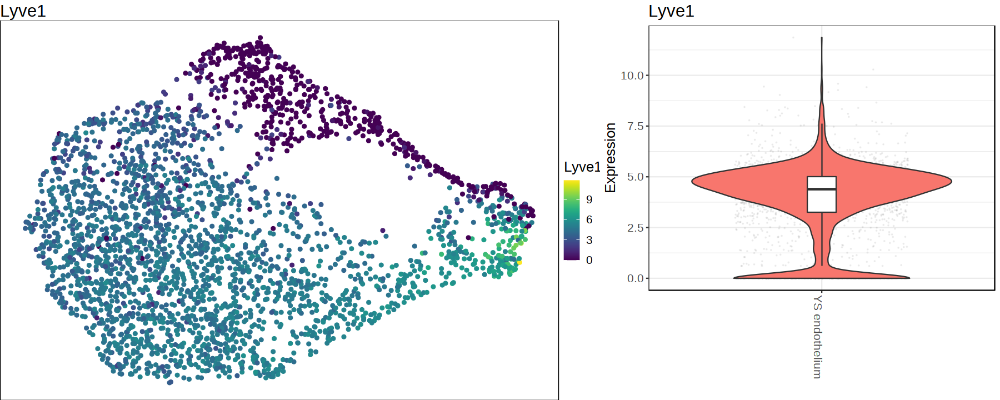

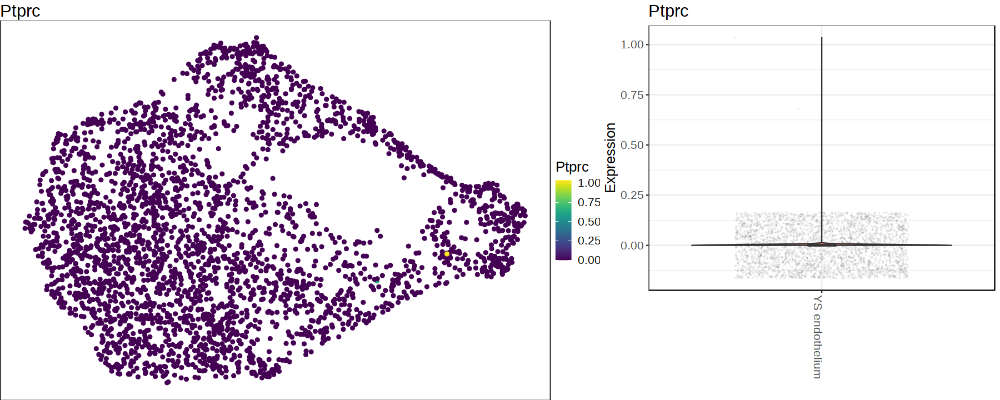

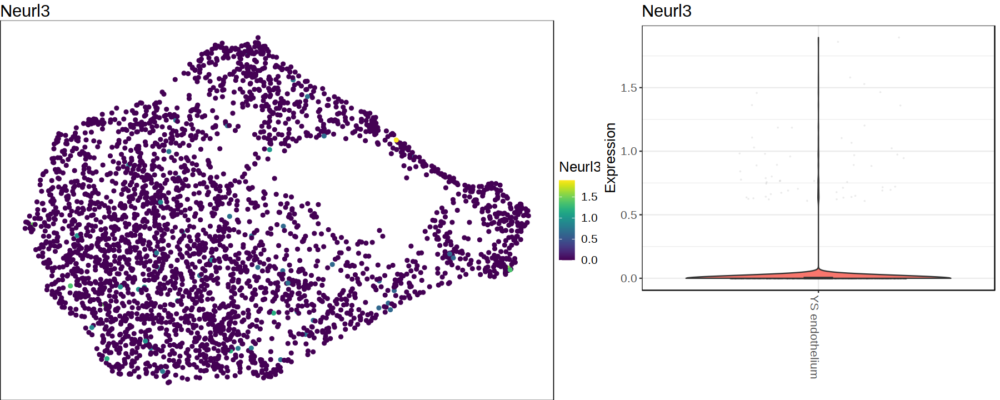

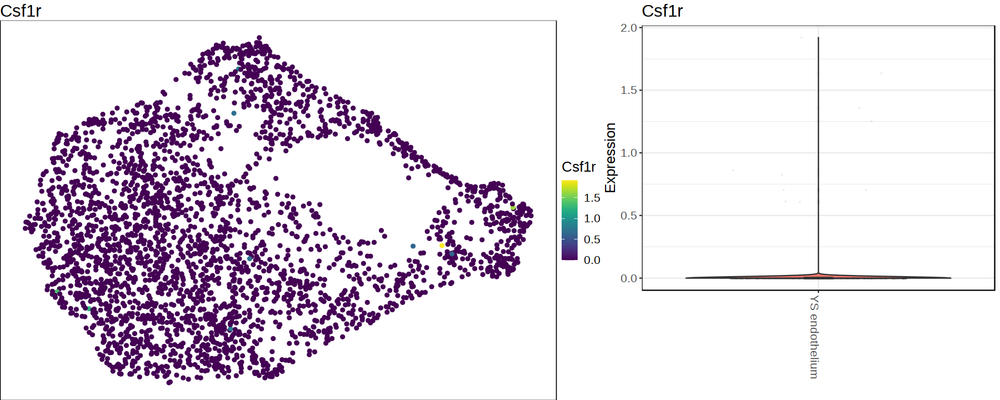

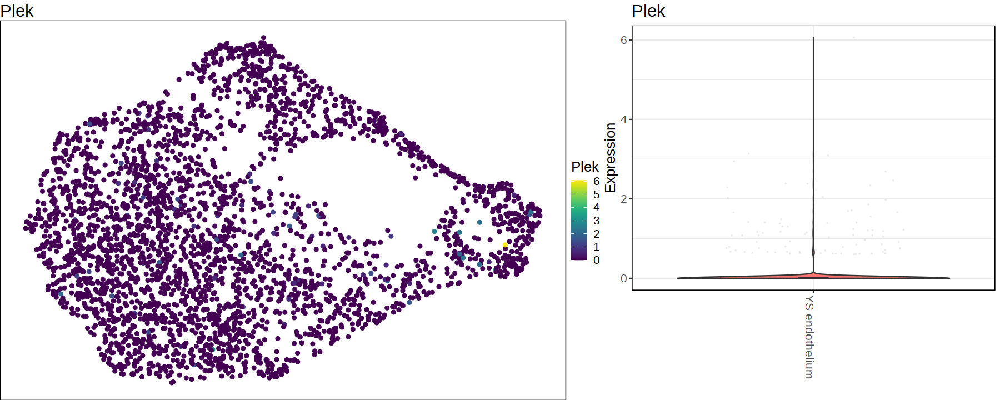

...

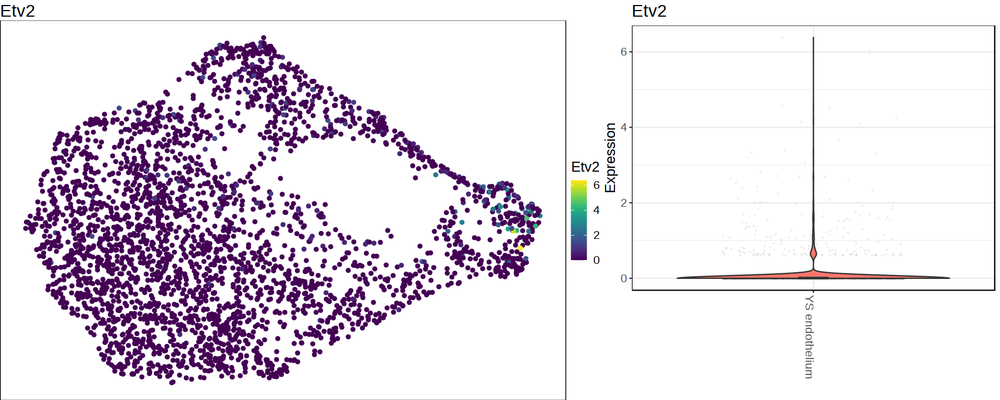

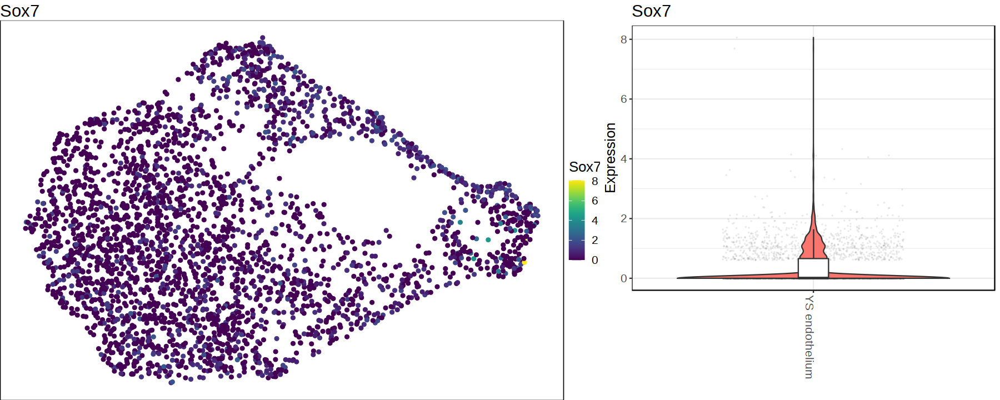

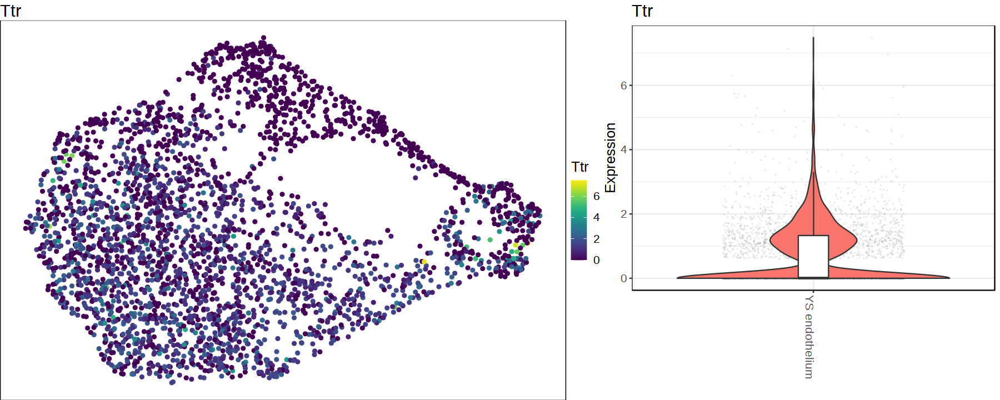

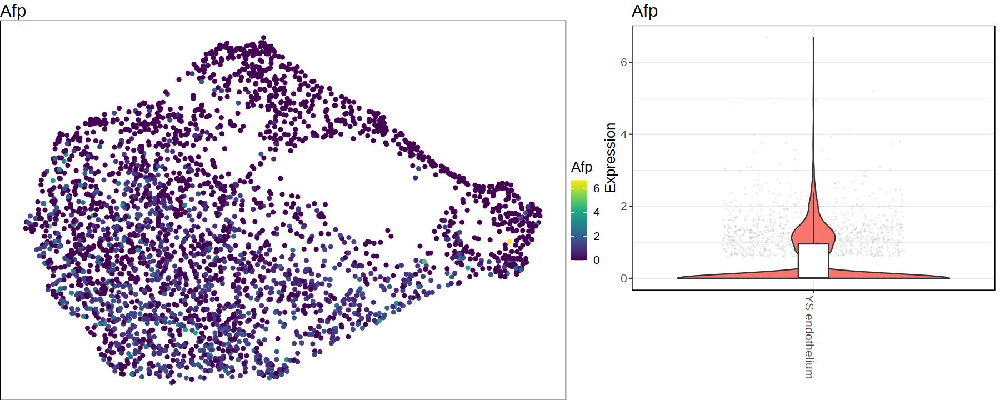

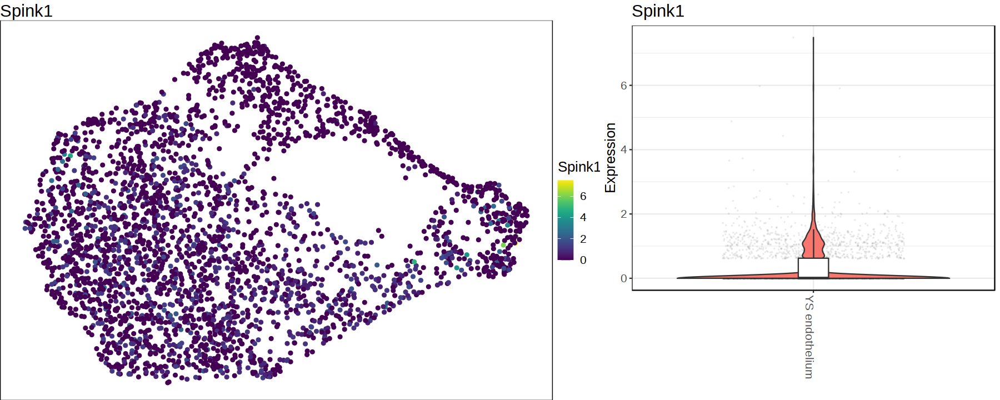

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]


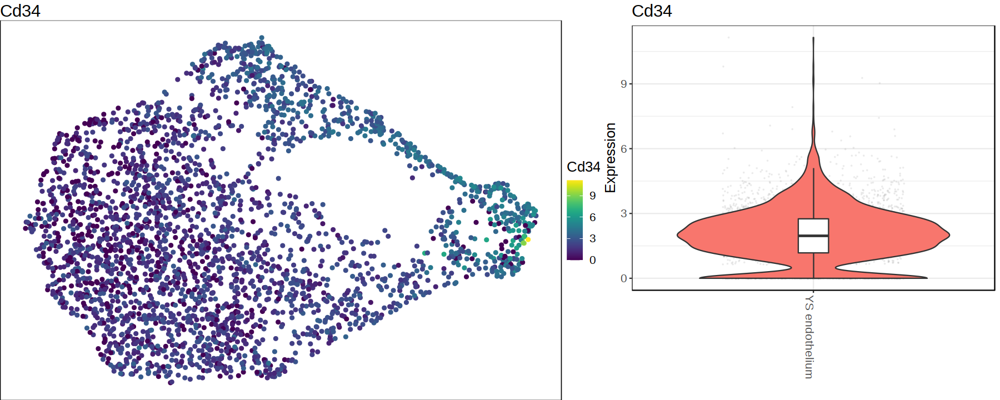

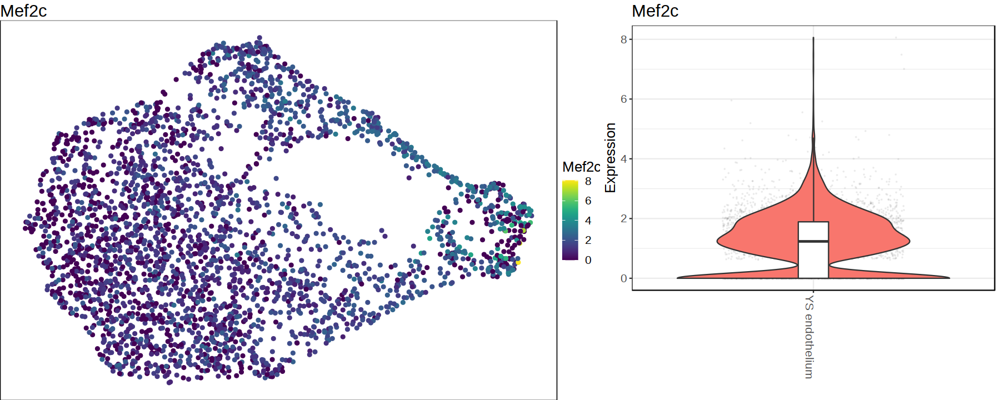

In [23]:
p = lapply(plot_genes, plot_gene, sce_in = sce_YS, reducedDim = 'UMAP', save_plot=FALSE)
p

In [24]:
unique(meta$celltype_extended_atlas)

[1] Blood progenitors         Allantois endothelium    
[3] Embryo proper endothelium EMP                      
[5] Venous endothelium        YS endothelium           
[7] Endocardium              
87 Levels: Allantois Allantois endothelium ... YS mesothelium-derived endothelial progenitors

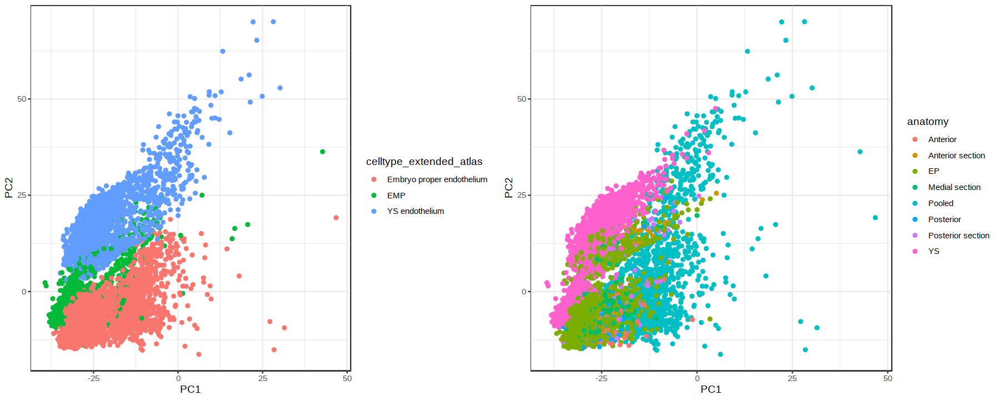

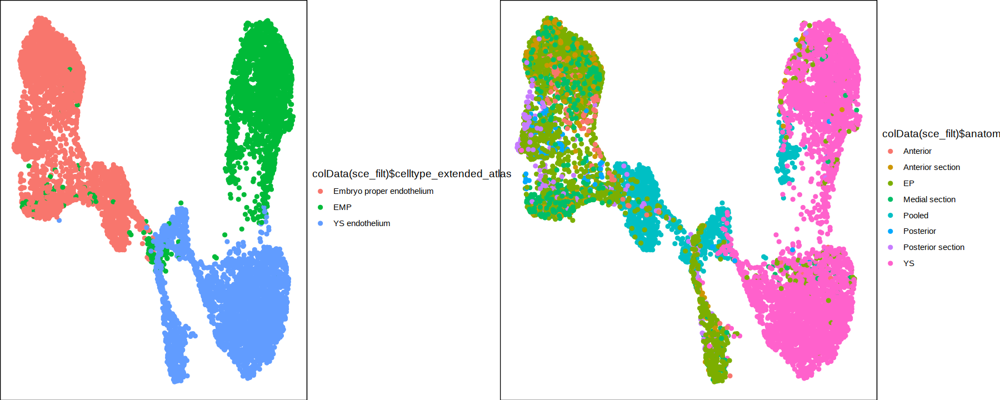

In [25]:
# pass selection criteria in the meta[selection filter]
sce_YS = sce[,as.character(meta[celltype_extended_atlas%in%c('Embryo proper endothelium', 'YS endothelium', 'EMP'), cell])]
sce_YS = subset_sce(sce_YS, npcs=7)

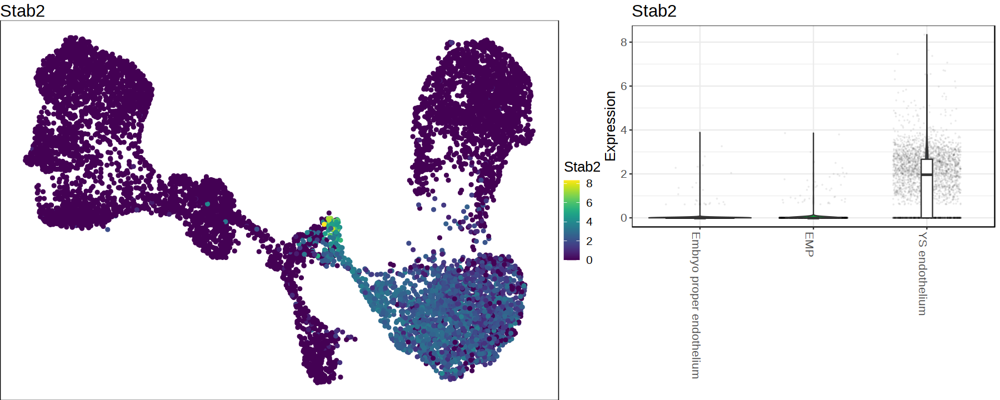

In [26]:
plot_gene('Stab2', sce_YS, reducedDim = 'UMAP', save_plot=FALSE)

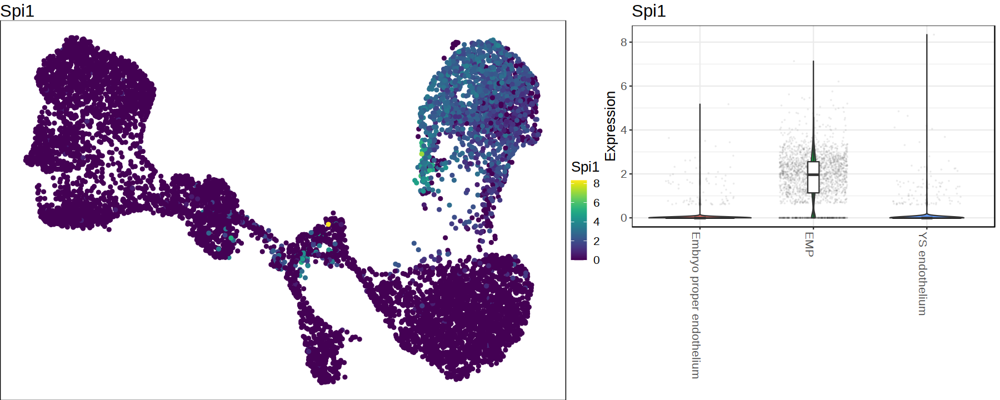

In [32]:
plot_gene('Spi1', sce_YS, reducedDim = 'UMAP', save_plot=FALSE)

In [46]:
plot_genes = c('Lyve1', 'Ptprc', 'Neurl3', 'Csf1r', 'Plek', 'Spn', 'Erg', 'Itga2b', 'Fli1', 'Hoxa7', 'Etv2', 'Sox7', 'Ttr', 'Afp', 'Spink1', 'Cd34', 'Mef2c')

In [47]:
#p = lapply(plot_genes, plot_gene, sce_in = sce_YS, reducedDim = 'UMAP', save_plot=FALSE)
#p

In [61]:
seurat_endo = as.Seurat(sce_YS)

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from Dim to Dim_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to Dim_”


In [64]:
ident = seurat_endo@meta.data$celltype_extended_atlas
names(ident) = colnames(sce_YS)

In [65]:
seurat_endo@active.ident = ident

In [66]:
markers = FindAllMarkers(seurat_endo)

Calculating cluster Embryo proper endothelium

Calculating cluster EMP

Calculating cluster YS endothelium



In [69]:
top_markers = as.data.table(markers) %>% .[,head(.SD,10), by='cluster']

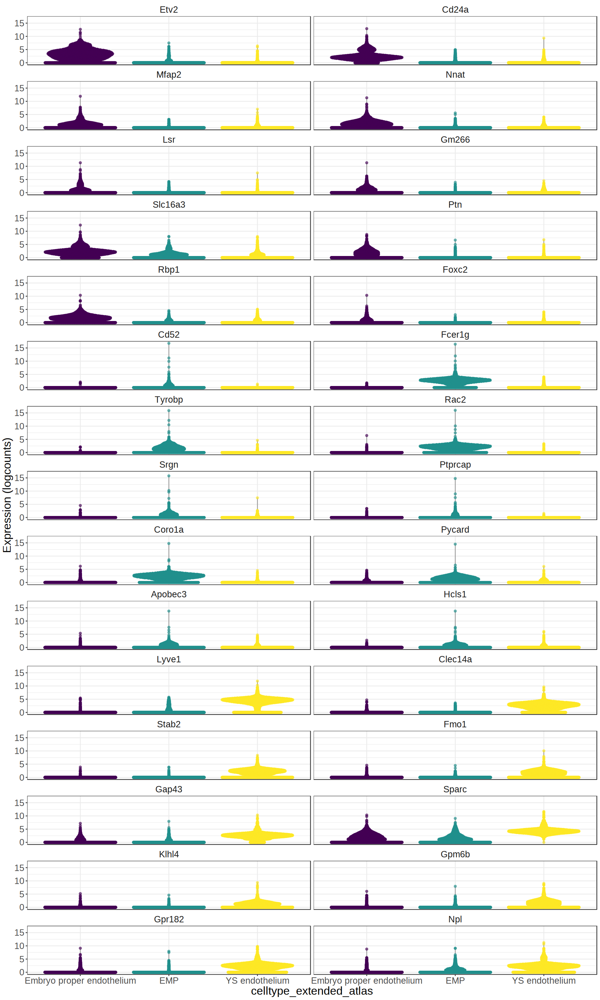

In [73]:
options(repr.plot.width=15,repr.plot.height=25)

plotExpression(sce_YS, features=top_markers$gene, 
    x="celltype_extended_atlas", colour_by="celltype_extended_atlas") + 
    theme_bw() + 
    theme(text=element_text(size=20), 
          strip.background=element_blank(),
         legend.position='none')


In [50]:
plot_genes = c('Sparc', 'Lgals1','Anxa2', 'Vim', 'Crip2', 'Mdk', 'Cd24a','Etv2', 'H2afy2', 'Prtg', 'Gpc3', 'Fcer1g','Coro1a', 'Pla2g4a', 'Rac2', 'Plek', 'Was')

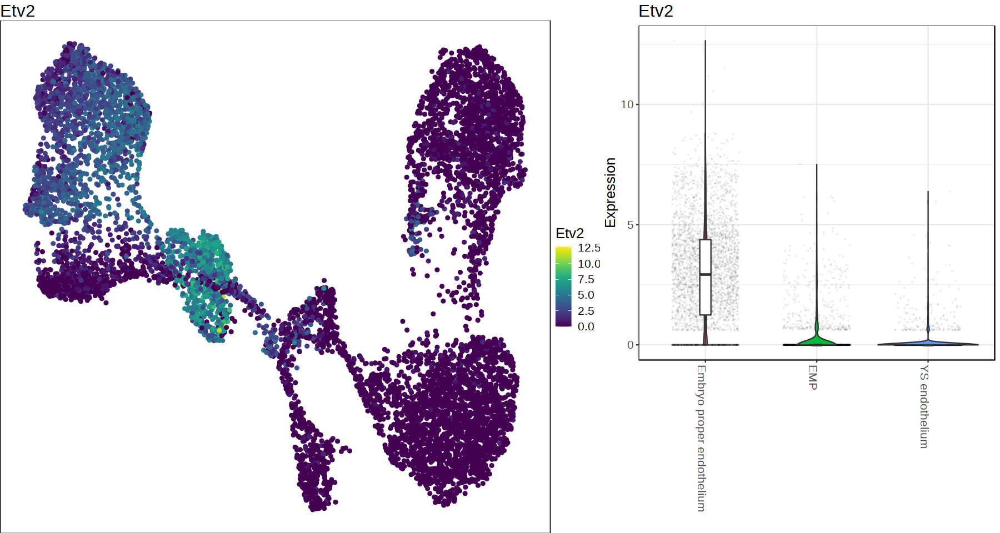

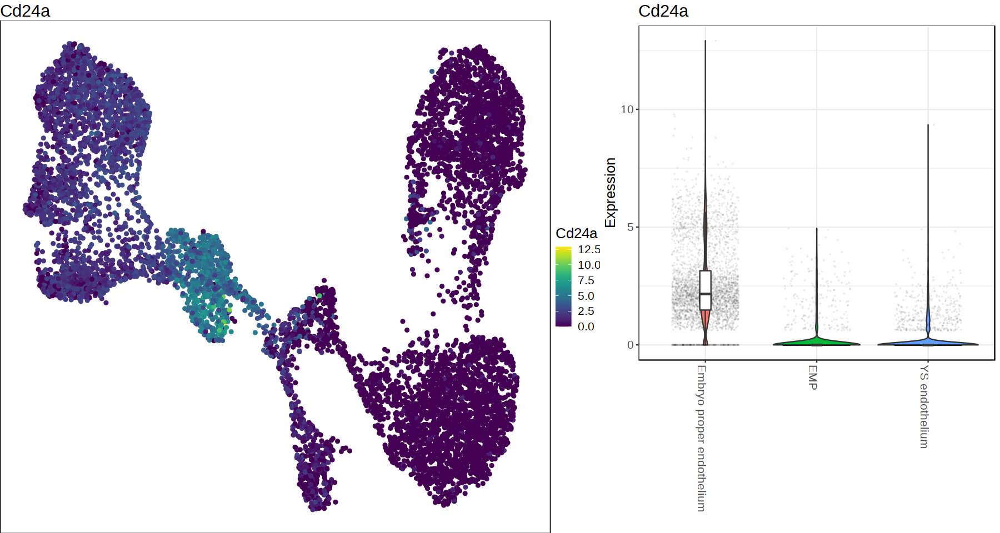

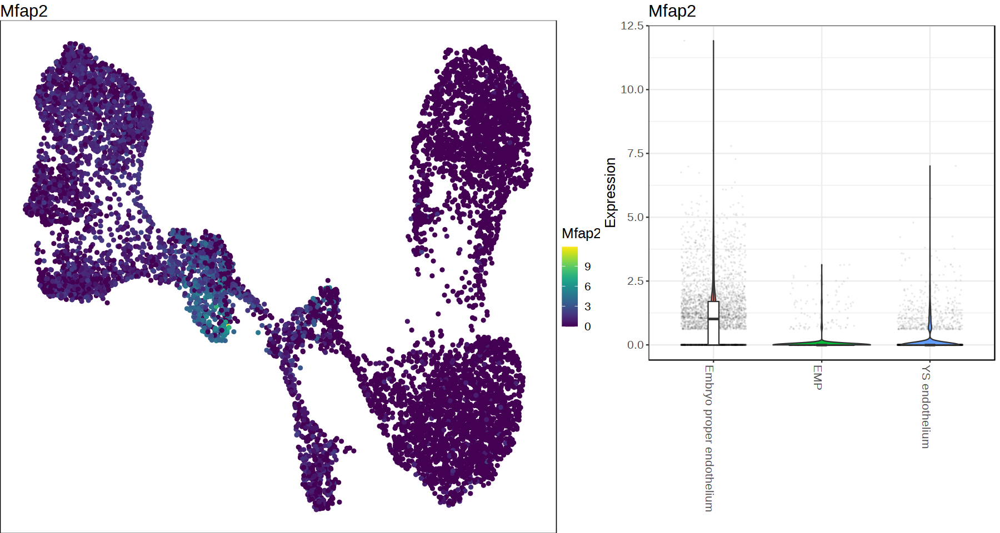

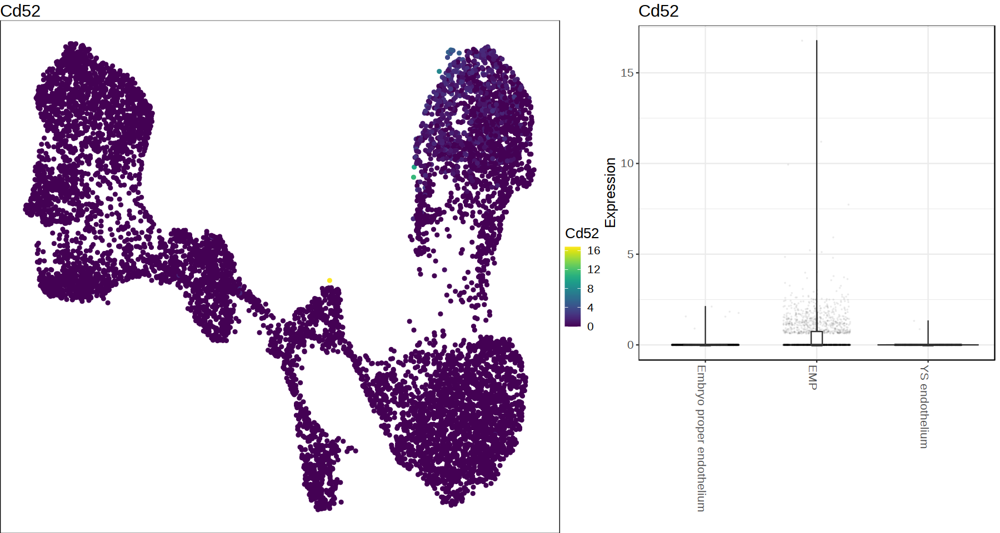

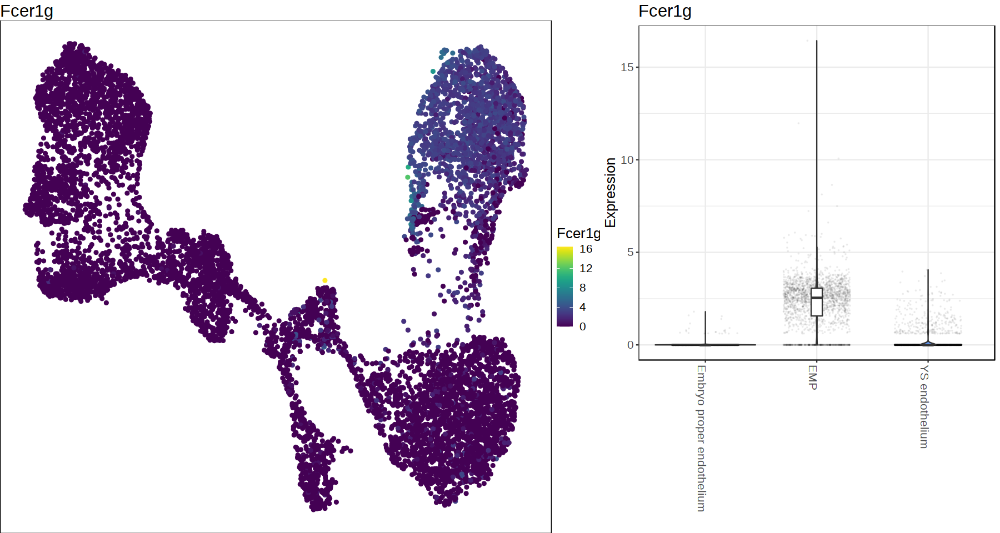

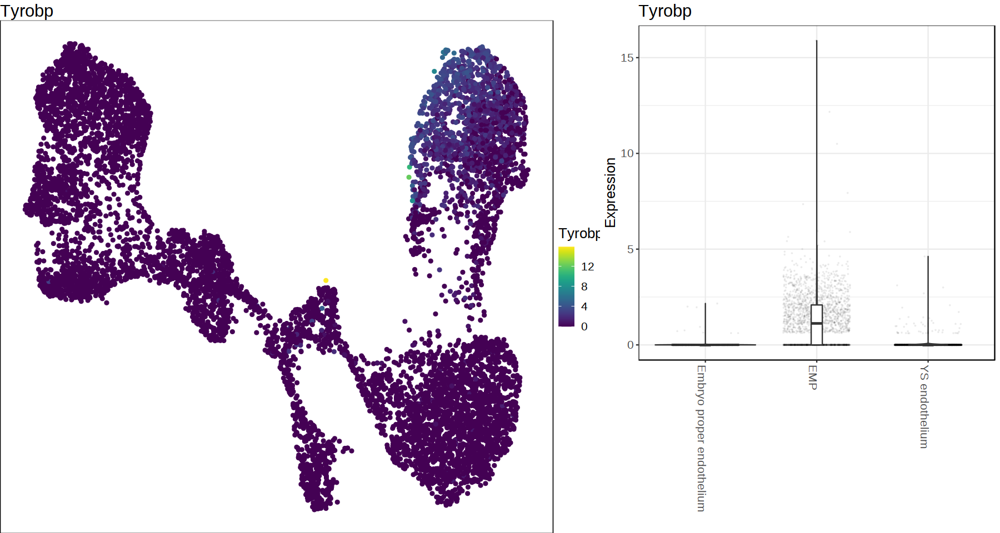

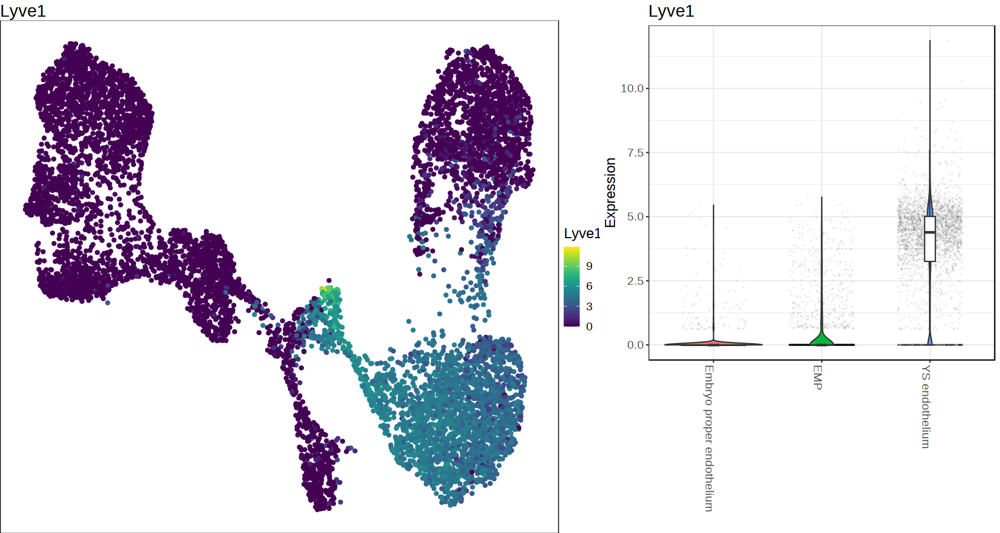

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]


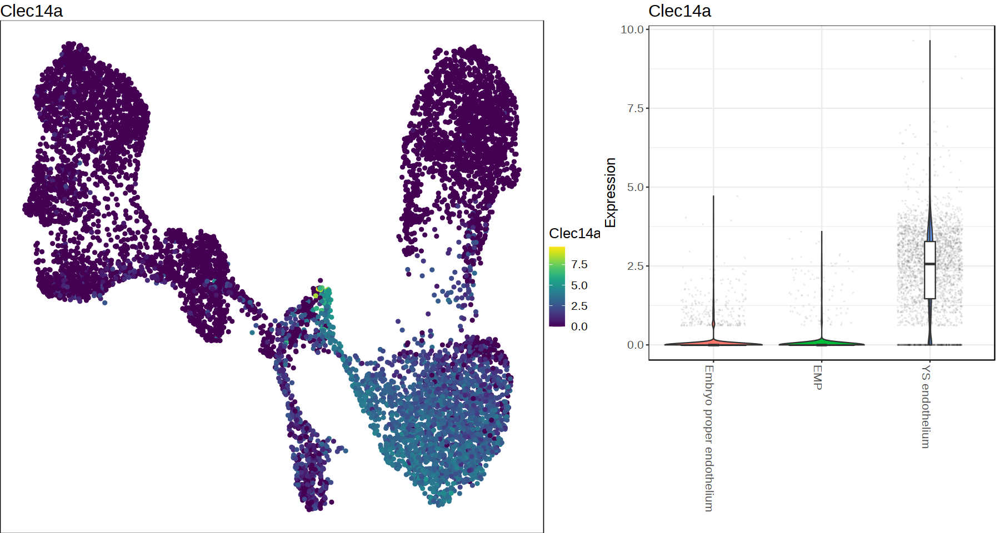

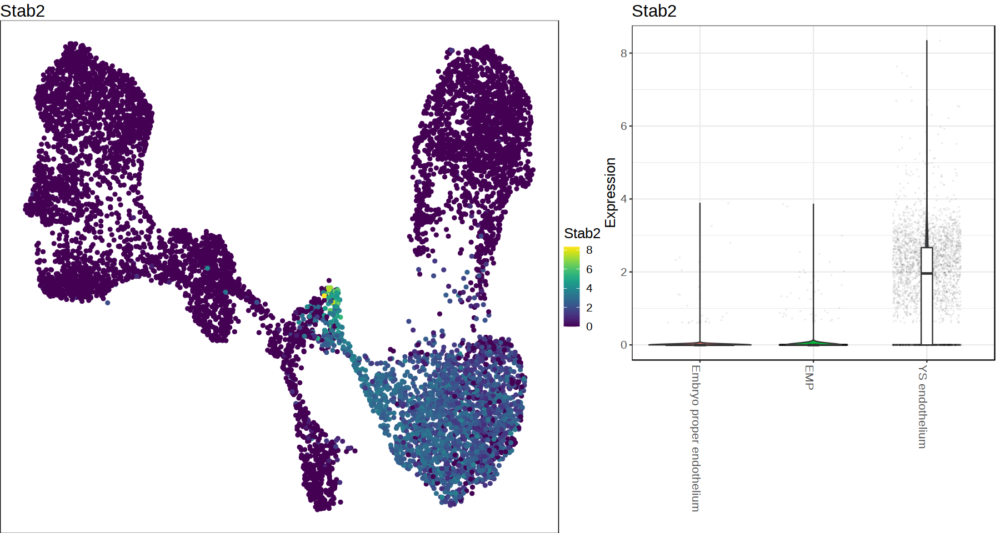

In [77]:
options(repr.plot.width=15,repr.plot.height=8)

top_markers = as.data.table(markers) %>% .[,head(.SD,3), by='cluster']
p = lapply(top_markers$gene, plot_gene, sce_in = sce_YS, reducedDim = 'UMAP', save_plot=FALSE)
p